<a href="https://colab.research.google.com/github/nataliamarinn/Nuestras_caras_grupo4/blob/main/G4_Nuestras_Caras.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Grupo 4 - *Nuestras Caras*

Autores: Arenas - Banegas - Marín

### Carga de librerías

In [2]:
from google.colab import drive
import os
import pandas as pd
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.manifold import Isomap
from sklearn.metrics import mean_squared_error
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from scipy.spatial.distance import cdist
import seaborn as sns
import pickle
import polars as pl
from typing import List, Optional
from sklearn.metrics import accuracy_score
import time
from glob import glob
import matplotlib.image as mpimg
import math
import random
import os
from tqdm import tqdm
from sklearn.metrics import ConfusionMatrixDisplay
import ipywidgets as widgets
from IPython.display import display, clear_output
import zipfile, tempfile
import shutil



## Herramientas necesarias

### Funciones de activación y derivadas

In [4]:
# Funciones de activación, se agrega softmax que se usa en la última capa para que nos de probabilidades.
def func_eval(fname, x):
    if fname == "purelin":
        return x
    elif fname == "logsig":
        return 1.0 / (1.0 + np.exp(-x))
    elif fname == "tansig":
        return 2.0 / (1.0 + np.exp(-2.0 * x)) - 1.0
    elif fname == "softmax":
        # Normaliza para evitar overflow numérico
        e_x = np.exp(x - np.max(x, axis=0, keepdims=True))
        return e_x / np.sum(e_x, axis=0, keepdims=True)
    else:
        raise ValueError(f"Función de activación no reconocida: {fname}")

# Versión vectorizada
func_eval_vec = np.vectorize(func_eval, excluded=['fname'])

# Derivadas de funciones de activación
def deriv_eval(fname, y):
    if fname == "purelin":
        return 1.0
    elif fname == "logsig":
        return y * (1.0 - y)
    elif fname == "tansig":
        return 1.0 - y ** 2
    elif fname == "softmax":
        return 1.0
    else:
        raise ValueError(f"Derivada no definida para función: {fname}")

# Vectorización de derivadas
deriv_eval_vec = np.vectorize(deriv_eval, excluded=['fname'])

### Carga de modelo de detección de rostos

La detección de rostros se realiza utilizando un modelo DNN (Deep Neural Network).

⚠ **Intentos fallidos**: se evaluaron otras alternativas antes de optar por DNN,

- *MediaPipe*: Ante fotos con las caras levemente rotadas o inclinadas, el modelo dejaba de detectar correctamente, ya que requiere estar de frente.

- *Haar Cascade*: a pesar de que el clasificador indicaba que se detectaban todas las fotos, al inspeccionar visualmente las imágenes, encontramos muchos falsos positivos (orejas, ropa).

- *face-alignment*: si bien en algunos casos logró corregir la inclinación, en muchos otros provocaba distorciones y deformaciones, alternado la forma original del rostro.

In [5]:
!wget -O res10_300x300_ssd_iter_140000.caffemodel https://github.com/opencv/opencv_3rdparty/raw/dnn_samples_face_detector_20170830/res10_300x300_ssd_iter_140000.caffemodel


--2025-05-05 01:12:35--  https://github.com/opencv/opencv_3rdparty/raw/dnn_samples_face_detector_20170830/res10_300x300_ssd_iter_140000.caffemodel
Resolving github.com (github.com)... 140.82.116.3
Connecting to github.com (github.com)|140.82.116.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/opencv/opencv_3rdparty/dnn_samples_face_detector_20170830/res10_300x300_ssd_iter_140000.caffemodel [following]
--2025-05-05 01:12:35--  https://raw.githubusercontent.com/opencv/opencv_3rdparty/dnn_samples_face_detector_20170830/res10_300x300_ssd_iter_140000.caffemodel
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10666211 (10M) [application/octet-stream]
Saving to: ‘res10_300x300_ssd_iter_140000.caffem

In [6]:
!wget -O deploy.prototxt https://raw.githubusercontent.com/opencv/opencv/master/samples/dnn/face_detector/deploy.prototxt


--2025-05-05 01:12:36--  https://raw.githubusercontent.com/opencv/opencv/master/samples/dnn/face_detector/deploy.prototxt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.111.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 28104 (27K) [text/plain]
Saving to: ‘deploy.prototxt’

deploy.prototxt     100%[===================>]  27.45K  --.-KB/s    in 0.002s  

2025-05-05 01:12:36 (11.9 MB/s) - ‘deploy.prototxt’ saved [28104/28104]



In [7]:
prototxt_path = "deploy.prototxt"
weights_path = "res10_300x300_ssd_iter_140000.caffemodel"
face_net = cv2.dnn.readNetFromCaffe(prototxt_path, weights_path)

### Funciones útiles

La función **leer_imagenes** construye un DataFrame con rutas de imágenes y etiquetas opcionales (si hay subcarpetas) extraídas del nombre de subcarpetas si las hay.
La función **detectar_rostro_dnn** utiliza un modelo DNN preentrenado de OpenCV para detectar el rostro, retornando su bounding box si supera un umbral de confianza que se le defina.
La función **procesar_rostros** recorta los rostros detectados aplicando un margen configurable, los convierte a escala de grises, los redimensiona al tamaño deseado (por defecto 80x80), y devuelve los arrays procesados junto a sus etiquetas y rutas a las imágenes.
Finalmente, las funciones **guardar_dataset** y **cargar_dataset** permiten serializar y recuperar datasets de imágenes preprocesadas en formato .pkl para facilitar su reutilización sin reprocesamiento.

In [8]:
def leer_imagenes(folder_path, usar_subcarpetas=True, extensiones=('.jpg', '.jpeg', '.png', '.jiff', '.jfif')):
    """Lee rutas de imágenes desde una carpeta, con o sin subcarpetas como etiquetas."""
    data = []
    if usar_subcarpetas:
        for subfolder in sorted(os.listdir(folder_path)):
            sub_path = os.path.join(folder_path, subfolder)
            if os.path.isdir(sub_path):
                for archivo in os.listdir(sub_path):
                    if archivo.lower().endswith(extensiones):
                        data.append({'imagen': os.path.join(sub_path, archivo), 'etiqueta': subfolder})
    else:
        for archivo in os.listdir(folder_path):
            if archivo.lower().endswith(extensiones):
                data.append({'imagen': os.path.join(folder_path, archivo), 'etiqueta': np.nan})
    return pd.DataFrame(data)



def detectar_rostro_dnn(img_rgb, face_net, conf_threshold=0.7):
    """Devuelve la bounding box del rostro principal si supera el umbral de confianza."""
    h, w = img_rgb.shape[:2]
    blob = cv2.dnn.blobFromImage(img_rgb, 1.0, (300, 300), (104.0, 177.0, 123.0), swapRB=False, crop=False)
    face_net.setInput(blob)
    detections = face_net.forward()

    if detections.shape[2] == 0:
        return None

    best = detections[0, 0, :, 2].argmax()
    confidence = detections[0, 0, best, 2]
    if confidence < conf_threshold:
        return None

    box = detections[0, 0, best, 3:7] * np.array([w, h, w, h])
    return tuple(map(int, box))


def procesar_rostros(df_imgs, face_net, output_size=(80, 80), margen=0.2, verbose=True):
    """Detecta y procesa los rostros: recorte, escala de grises y resize.
    Devuelve X, y y los paths de imágenes que se procesaron correctamente.
    """
    X, y, fallidas, paths_validos = [], [], [], []

    for _, fila in df_imgs.iterrows():
        path = fila['imagen']
        etiqueta = fila['etiqueta']

        img = cv2.imread(path)
        if img is None:
            fallidas.append(path)
            continue

        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        box = detectar_rostro_dnn(img_rgb, face_net)

        if box is None:
            fallidas.append(path)
            continue

        x_min, y_min, x_max, y_max = box
        dx, dy = int((x_max - x_min) * margen), int((y_max - y_min) * margen)
        h, w = img.shape[:2]

        # Ajustar el bounding box, puntos de la caja
        x_min = max(0, x_min - dx)
        y_min = max(0, y_min - dy)
        x_max = min(w, x_max + dx)
        y_max = min(h, y_max + dy)

        rostro = img[y_min:y_max, x_min:x_max]
        if rostro.size == 0:
            fallidas.append(path)
            continue

        rostro_gray = cv2.cvtColor(rostro, cv2.COLOR_BGR2GRAY)
        rostro_resized = cv2.resize(rostro_gray, output_size)

        X.append(rostro_resized)
        y.append(etiqueta)
        paths_validos.append(path)  # se guardan únicamente las fotos que fueron detectadas

    if verbose:
        print("\nRostros no detectados:")
        for f in fallidas:
            print("-", f)
        print(f"Total fallidos: {len(fallidas)} / {len(df_imgs)} imágenes ({len(fallidas)/len(df_imgs):.1%})")

    return np.array(X), np.array(y), paths_validos


def guardar_dataset(X, y, paths, path_pkl):
    with open(path_pkl, 'wb') as f:
        pickle.dump((X, y, paths), f)
    print(f"✅ Dataset guardado en: {path_pkl}")
def cargar_dataset(path_pkl):
    with open(path_pkl, 'rb') as f:
        return pickle.load(f)  # Devuelve X, y, paths de las fotos

def mostrar_confusiones(df, real, predicha, max_imgs=10):
    """
    Muestra imágenes donde la red confundió `real` con `predicha`.

    Parámetros:
        df: DataFrame con las columnas ['Etiqueta real', 'Etiqueta predicha', 'Path imagen']
        real (str): Etiqueta real que queremos analizar
        predicha (str): Etiqueta con la que fue confundida
        max_imgs (int): Número máximo de imágenes a mostrar
    """
    df_confundidas = df[
        (df['Etiqueta real'] == real) & (df['Etiqueta predicha'] == predicha)
    ]

    if df_confundidas.empty:
        print(f"No se encontraron confusiones entre {real} y {predicha}.")
        return

    n = min(max_imgs, len(df_confundidas))
    fig, axes = plt.subplots(1, n, figsize=(2.5 * n, 3))

    if n == 1:
        axes = [axes]

    for i, path in enumerate(df_confundidas['Path imagen'].iloc[:n]):
        img = cv2.imread(path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes[i].imshow(img)
        axes[i].set_title(os.path.basename(path), fontsize=8)
        axes[i].axis('off')

    plt.suptitle(f"{real} confundido con {predicha}")
    plt.tight_layout()
    plt.show()


La función **clasificar_widget_usuario** crea una interfaz interactiva en Google Colab donde el usuario puede subir imágenes o archivos .zip con fotos. Luego de subir los archivos y hacer clic en un botón, la función procesa las imágenes detectando rostros, los convierte a escala de grises y aplica el mismo modelo de reducción de dimensionalidad (Isomap) y la red neuronal entrenada (multiperceptron) para clasificarlas. Finalmente, muestra las imágenes clasificadas en una grilla, indicando para cada una si pertenece a una persona conocida o si debe ser marcada como "INTRUSO", según un umbral de confianza predefinido.

In [9]:
def clasificar_widget_usuario(modelo_red_path, modelo_data_path, modelo_iso_path, face_net, umbral=0.85):
    import ipywidgets as widgets
    from IPython.display import display, clear_output
    import os, tempfile, zipfile, shutil
    import pickle
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    import polars as pl

    upload = widgets.FileUpload(accept='.jpg,.jpeg,.png,.jfif,.zip', multiple=True)
    boton = widgets.Button(description="Clasificar imágenes")
    output = widgets.Output()

    display(widgets.HTML("<h3>Subí tus imágenes o un ZIP con fotos</h3>"))
    display(upload, boton, output)

    def procesar_y_mostrar(paths):
        # 1. Leer imágenes
        df_imgs = pd.DataFrame({'imagen': paths, 'etiqueta': [np.nan]*len(paths)})
        X, _, paths_validos = procesar_rostros(df_imgs, face_net, output_size=(80, 80), margen=0.02)

        if len(X) == 0:
            print("No se detectaron rostros.")
            return

        # 2. Reducción con Isomap
        X_flat = X.reshape(X.shape[0], -1)
        with open(modelo_iso_path, 'rb') as f:
            iso = pickle.load(f)
        X_reducido = iso.transform(X_flat)

        # 3. Cargar red y datos
        with open(modelo_red_path, 'rb') as f:
            red = pickle.load(f)
        with open(modelo_data_path, 'rb') as f:
            data = pickle.load(f)

        columnas = data['columnas']
        df_pred = pd.DataFrame(X_reducido, columns=columnas)
        df_pred_pl = pl.DataFrame(df_pred)

        mp = multiperceptron()
        mp.red = red
        mp.data = data

        y_pred, y_proba, _ = mp.predecir(df_pred_pl, campos=columnas, clase=None)

        # 4. Mostrar resultados
        n = len(X)
        cols = 5
        rows = int(np.ceil(n / cols))
        plt.figure(figsize=(3 * cols, 3.5 * rows))

        for i in range(n):
            clase_pred = y_pred[i]
            confianza = np.max(y_proba[i])
            es_intruso = confianza < umbral
            clase_mostrada = f"🚫 Intruso\n(el modelo piensa que es: {clase_pred})" if es_intruso else clase_pred

            plt.subplot(rows, cols, i + 1)
            plt.imshow(X[i], cmap='gray')
            plt.title(f"{clase_mostrada}\nConf: {confianza:.2f}", fontsize=8,
                      color='red' if es_intruso else 'black')
            plt.axis("off")

        plt.tight_layout()
        plt.show()

    def on_click(b):
        with output:
            clear_output(wait=True)
            if not upload.value:
                print("No se subieron archivos.")
                return

            tempdir = tempfile.mkdtemp()
            paths_temp = []

            try:
                for nombre, archivo in upload.value.items():
                    contenido = archivo["content"]
                    if nombre.lower().endswith('.zip'):
                        zip_path = os.path.join(tempdir, nombre)
                        with open(zip_path, 'wb') as f:
                            f.write(contenido)
                        with zipfile.ZipFile(zip_path, 'r') as zip_ref:
                            zip_ref.extractall(tempdir)
                        for root, _, files in os.walk(tempdir):
                            for fimg in files:
                                if fimg.lower().endswith(('.jpg', '.jpeg', '.png', '.jfif')):
                                    paths_temp.append(os.path.join(root, fimg))
                    elif nombre.lower().endswith(('.jpg', '.jpeg', '.png', '.jfif')):
                        path_temp = os.path.join(tempdir, nombre)
                        with open(path_temp, 'wb') as f:
                            f.write(contenido)
                        paths_temp.append(path_temp)

                if not paths_temp:
                    print("No se encontraron imágenes válidas.")
                    return

                procesar_y_mostrar(paths_temp)

            finally:
                shutil.rmtree(tempdir)

    boton.on_click(on_click)


### Clase Multiperceptrón

In [10]:
class multiperceptron:
    def __init__(self):
        self.data = dict()
        self.red = dict()
        self.carpeta = ""

    def _red_init(self, semilla: int):
        niveles = self.red['arq']['layers_qty']
        np.random.seed(semilla)
        for i in range(niveles):
            nivel = dict()
            nivel['id'] = i
            nivel['last'] = (i == (niveles - 1))
            nivel['size'] = self.red["arq"]["layers_size"][i]
            nivel['func'] = self.red["arq"]["layers_func"][i]

            entrada_size = self.red['arq']['input_size'] if i == 0 else self.red['arq']['layers_size'][i - 1]
            salida_size = nivel['size']

            nivel['W'] = np.random.uniform(-0.5, 0.5, (salida_size, entrada_size))
            nivel['w0'] = np.random.uniform(-0.5, 0.5, (salida_size, 1))
            nivel['W_m'] = np.zeros((salida_size, entrada_size))
            nivel['w0_m'] = np.zeros((salida_size, 1))

            self.red['layer'].append(nivel)

    def inicializar(self, df: pl.DataFrame, campos: List[str], clase: str,
                    hidden_layers_sizes: List[int], layers_func: List[str],
                    semilla: int, carpeta: str, clases_totales: Optional[List[str]] = None):
        # Normalizar entrada X
        X = df.select(campos).to_numpy()
        X_mean = X.mean(axis=0)
        X_sd = X.std(axis=0)
        X_std = (X - X_mean) / X_sd
        self.data['X'] = X_std
        self.data['X_mean'] = X_mean
        self.data['X_sd'] = X_sd

        # Etiquetas y one-hot
        y = df.select(clase).to_numpy().reshape(-1)
        self.data['Ylabel'] = y

        df_dummy = df.to_dummies(columns=[clase])
        columnas_originales = set(df.columns)
        columnas_dummies = [c for c in df_dummy.columns if c not in columnas_originales]

        if clases_totales is not None:
            columnas_dummies_completas = [f"{clase}_{c}" for c in clases_totales]
            for col in columnas_dummies_completas:
                if col not in df_dummy.columns:
                    df_dummy = df_dummy.with_columns(pl.lit(0).alias(col))
            columnas_dummies = columnas_dummies_completas

        self.data['Y'] = df_dummy.select(columnas_dummies).to_numpy()
        clases = [c.replace(f"{clase}_", "") for c in columnas_dummies]

        tamanos = hidden_layers_sizes.copy()
        tamanos.append(self.data['Y'].shape[1])

        self.red['arq'] = {
            'input_size': self.data['X'].shape[1],
            'input_mean': X_mean,
            'input_sd': X_sd,
            'output_values': clases,
            'layers_qty': len(tamanos),
            'layers_size': tamanos,
            'layers_func': layers_func
        }

        self.red['work'] = {
            'epoch': 0,
            'MSE': float('inf'),
            'train_error_rate': float('inf')
        }

        self.red['layer'] = []
        self._red_init(semilla)

        self.carpeta = carpeta
        os.makedirs(carpeta, exist_ok=True)
        with open(f"{carpeta}/data.pkl", 'wb') as f:
            pickle.dump(self.data, f)
        with open(f"{carpeta}/red.pkl", 'wb') as f:
            pickle.dump(self.red, f)

    def entrenar(self, epoch_limit: int, MSE_umbral: float,
                 learning_rate: float, lr_momento: float,
                 save_frequency: int = 500, retomar: bool = True):
        if retomar:
            self.cargar_pesos()

        epoch = self.red['work']['epoch']
        MSE = self.red['work']['MSE']
        X = self.data['X']
        Y = self.data['Y']
        Xfilas = X.shape[0]
        niveles = self.red["arq"]["layers_qty"]

        while (MSE > MSE_umbral) and (epoch < epoch_limit):
            epoch += 1
            for fila in range(Xfilas):
                x = X[fila:fila+1, :].T
                clase = Y[fila:fila+1, :].T
                vsalida = []

                entrada = x
                for i in range(niveles):
                    func = self.red['layer'][i]['func']
                    estimulos = self.red['layer'][i]['W'] @ entrada + self.red['layer'][i]['w0']
                    salida = func_eval(func, estimulos) if func != "softmax" else func_eval("softmax", estimulos) #se agrega función softmax a la salida
                    vsalida.append(salida)
                    entrada = salida

                verror = [0] * (niveles + 1)
                verror[niveles] = clase - vsalida[-1]

                for i in reversed(range(niveles)):
                    func = self.red['layer'][i]['func']
                    if i < niveles - 1:
                        verror[i] = deriv_eval_vec(func, vsalida[i]) * (self.red['layer'][i + 1]['W'].T @ verror[i + 1])
                    else:
                        verror[i] = deriv_eval_vec(func, vsalida[i]) * verror[i + 1]

                entrada = x
                for i in range(niveles):
                    self.red['layer'][i]['W_m'] = learning_rate * (verror[i] @ entrada.T) + lr_momento * self.red['layer'][i]['W_m']
                    self.red['layer'][i]['w0_m'] = learning_rate * verror[i] + lr_momento * self.red['layer'][i]['w0_m']
                    self.red['layer'][i]['W'] += self.red['layer'][i]['W_m']
                    self.red['layer'][i]['w0'] += self.red['layer'][i]['w0_m']
                    entrada = vsalida[i]

            entrada = X.T
            for i in range(niveles):
                func = self.red['layer'][i]['func']
                estimulos = self.red['layer'][i]['W'] @ entrada + self.red['layer'][i]['w0']
                entrada = func_eval(func, estimulos) if func != "softmax" else func_eval("softmax", estimulos)

            MSE = np.mean((Y.T - entrada) ** 2)
            pred = np.argmax(entrada.T, axis=1)
            out = np.array(self.red["arq"]['output_values'])
            error_rate = np.mean(self.data['Ylabel'] != out[pred])

            if (epoch % save_frequency == 0) or (MSE <= MSE_umbral) or (epoch >= epoch_limit):
                self.red['work']['epoch'] = epoch
                self.red['work']['MSE'] = MSE
                self.red['work']['train_error_rate'] = error_rate
                with open(f"{self.carpeta}/red.pkl", 'wb') as f:
                    pickle.dump(self.red, f)

        return epoch, MSE, self.red['work']['train_error_rate']

    def predecir(self, df_new: pl.DataFrame, campos: List[str], clase: str):
        niveles = self.red['arq']['layers_qty']
        X_new = df_new.select(campos).to_numpy()
        X_new = (X_new - self.red['arq']['input_mean']) / self.red['arq']['input_sd']
        entrada = X_new.T

        for i in range(niveles):
            func = self.red['layer'][i]['func']
            estimulos = self.red['layer'][i]['W'] @ entrada + self.red['layer'][i]['w0']
            entrada = func_eval(func, estimulos) if func != "softmax" else func_eval("softmax", estimulos)

        pred_idx = np.argmax(entrada.T, axis=1)
        pred_raw = np.max(entrada.T, axis=1)
        out = np.array(self.red['arq']['output_values'])

        y_real = df_new.select(clase).to_numpy().reshape(-1)
        error_rate = np.mean(y_real != out[pred_idx])

        return out[pred_idx], pred_raw, error_rate

    def cargar_pesos(self):
        with open(f"{self.carpeta}/data.pkl", 'rb') as f:
            self.data = pickle.load(f)
        with open(f"{self.carpeta}/red.pkl", 'rb') as f:
            self.red = pickle.load(f)


## Conexión a Google Colab

In [11]:
# Conectar con Google Drive
drive.mount('/content/drive')
folder_path = '/content/drive/MyDrive/Caras' # Carpeta con subcarpetas de fotos de cada alumno

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Flujo de lectura de imágenes y su pre-procesamiento

In [ ]:
df = leer_imagenes(folder_path, usar_subcarpetas=True)

In [ ]:
X, y, paths = procesar_rostros(df, face_net, output_size=(80, 80), margen=0.02)



Rostros no detectados:
Total fallidos: 0 / 449 imágenes (0.0%)


In [ ]:
output_pkl_path = '/content/drive/MyDrive/rostros_dataset.pkl'
guardar_dataset(X, y, paths, output_pkl_path)


✅ Dataset guardado en: /content/drive/MyDrive/rostros_dataset.pkl


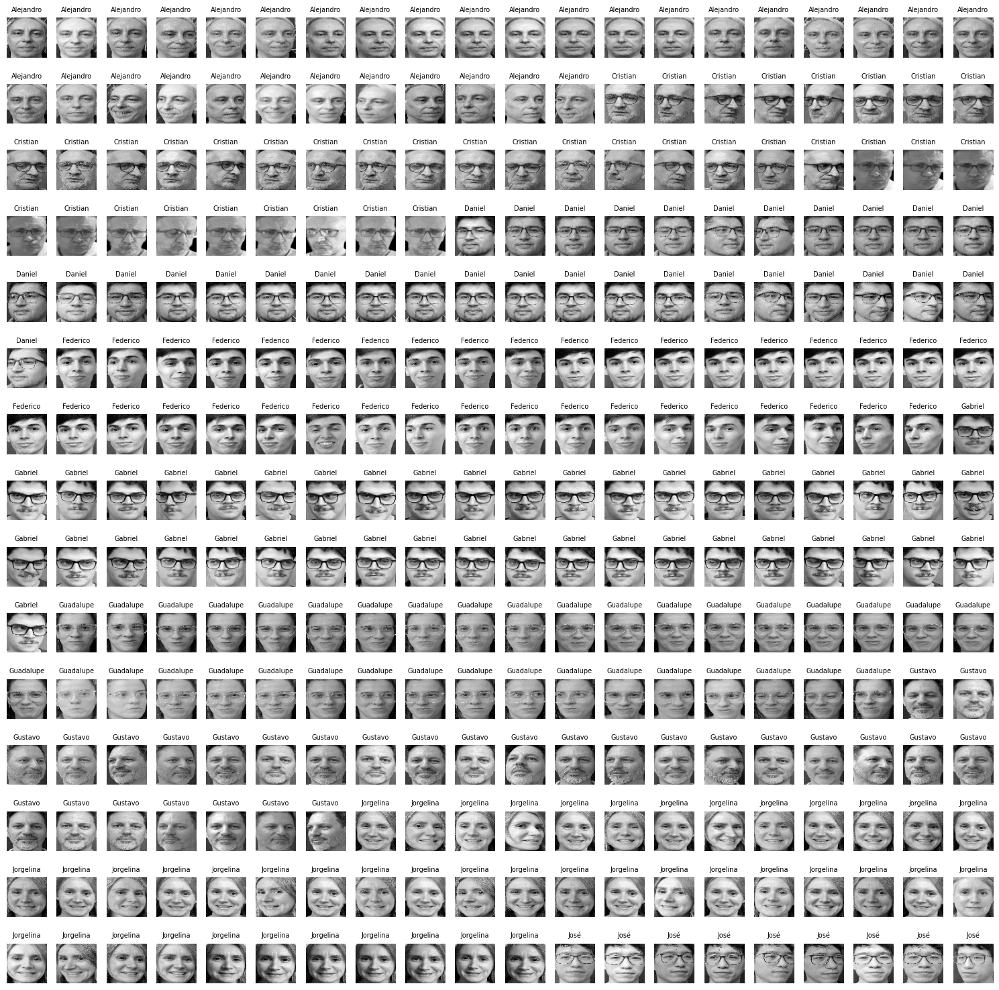

In [ ]:
# Caras con sus etiquetas
num_to_show = min(300, len(X))
plt.figure(figsize=(15, 15))
for i in range(num_to_show):
    plt.subplot(15, 20, i + 1)
    plt.imshow(X[i], cmap='gray')
    plt.title(str(y[i]), fontsize=7)
    plt.axis('off')
plt.tight_layout()
plt.show()

## Flujo entrenamiento de la red

Para la etapa del entrenamiento, trabajamos con la clase *multiperceptron* que implementa una neuronal multicapa.  
Con el objetivo de clasificar a los 13 alumnos, la capa de salida está configurada con 13 neuronas.
Para poder asignar una probabilidad a cada persona, se incorporó la función **softmax** en la última capa, la cual convierte los valores en una función de probabilidad de las clases posibles.



Para optimizar, se implementó un **Grid Search completo** que abarca tanto la etapa de redución de dimensionalidad usando Isomap como la configuración de los hiperparámetros de la red.

⚠ Intento fallido: inicialmente se planificó otra estrategia de entrenamiento: dos grid search. El primero servía para encontrar los mejores parámetros de isomap y generar los archivos que ingresarían a la red. El segundo para entrenar las redes neuronales sobre estos datasets reducidos.

*¿Qué falló?* Muchos problemas de consistencia y reproducibilidad, al guardar los datos ya reducidos, se perdía un poco la trazabilidad del split original y sospechamos que tal vez se contaminaba el test. Durante las primeras pruebas, algunos modelos devolvían valores de test accuracy sorprendentemente altos, lo que sugería un desempeño excelente. Sin embargo, al intentar validar estos resultados manualmente, todas las predicciones erraban.

In [34]:
#Importamos las caras, las etiquetas y los paths de las imágenes
ruta_pkl = '/content/drive/MyDrive/rostros_dataset.pkl'
with open(ruta_pkl, 'rb') as f:
    X, y, paths = pickle.load(f)

# Aplanar imágenes
X_flat = X.reshape((X.shape[0], -1))


In [35]:
# Se extraen las clases únicas, los 13 alumnos
clases_totales = sorted(list(np.unique(y)))


In [ ]:
# Los resultados
carpeta_modelo = '/content/drive/MyDrive/final_resultados'
os.makedirs(carpeta_modelo, exist_ok=True)

# Los resultados parciales de cada combinación
carpeta_resultados = '/content/drive/MyDrive/parciales_resultados'
os.makedirs(carpeta_resultados, exist_ok=True)

ruta_resultados = os.path.join(carpeta_resultados, 'resultados_parciales.csv')

In [175]:
# --- Hiperparámetros ---  # entre los integrantes del grupo probamos distintas combinaciones, aquí sólo se presenta una búsqueda
semillas_split = [42,65]
semillas_red = [1,831]
test_sizes = [0.2, 0.25,0.3]
vecinos_isomap = [12,15]
componentes_posibles = range(15, 60, 5)

n_capas_posibles = [2,3]
neuronas_posibles = [12,13]
funciones_posibles = ['logsig', 'tansig']
learning_rates = [0.01,0.03,0.05]
epoch_limits = [5000, 50000]
mse_umbrales = [0.0005]


In [ ]:
# Leer si hay combinaciones previas ya corridas para no repetir
# Nota: si se corto el colab es necesario correr de nuevo las librerías, las herramientas y conectar al colab
# No es necesario volver a procesar las imágenes porque ya fueron guardadas en un pkl


if os.path.exists(ruta_resultados):
    df_previos = pd.read_csv(ruta_resultados)
    combinaciones_ya_corridas = set(
        tuple(row) for row in df_previos[[
            'semilla_split', 'semilla_red', 'test_size', 'n_vecinos_isomap',
            'n_componentes', 'n_capas', 'neuronas', 'funcion_activacion',
            'learning_rate', 'epoch_limit', 'mse_umbral'
        ]].itertuples(index=False, name=None)
    )
else:
    df_previos = pd.DataFrame()
    combinaciones_ya_corridas = set()

# Resultados ya acumulados - esto sirve para cuando se corta el colab
resultados_finales = []

# GRID SEARCH
for semilla_split in semillas_split:
    for test_size in test_sizes:
        X_train, X_test, y_train, y_test, paths_train, paths_test = train_test_split(
            X_flat, y, paths, test_size=test_size, random_state=semilla_split, stratify=y
        )

        for n_vecinos in vecinos_isomap:
            scores = []
            for n_comp in componentes_posibles:
                try:
                    iso = Isomap(n_neighbors=n_vecinos, n_components=n_comp)
                    X_train_reducido = iso.fit_transform(X_train)
                    score = cross_val_score(KNeighborsClassifier(5), X_train_reducido, y_train, cv=5).mean()
                    scores.append((n_comp, score))
                except Exception:
                    continue

            if not scores:
                continue

            mejor_n, score_cv = max(scores, key=lambda x: x[1])
            iso = Isomap(n_neighbors=n_vecinos, n_components=mejor_n)
            X_train_reducido = iso.fit_transform(X_train)
            X_test_reducido = iso.transform(X_test)

            columnas = [f"x{i+1}" for i in range(X_train_reducido.shape[1])]
            df_train = pl.DataFrame(X_train_reducido, schema=columnas).with_columns(pl.Series("y", y_train))
            df_test = pl.DataFrame(X_test_reducido, schema=columnas).with_columns(pl.Series("y", y_test))

            for semilla_red in semillas_red:
                for n_capas in n_capas_posibles:
                    for neuronas in neuronas_posibles:
                        for funcion in funciones_posibles:
                            for lr in learning_rates:
                                for epoch_limit in epoch_limits:
                                    for mse_umbral in mse_umbrales:

                                        id_comb = (
                                            semilla_split, semilla_red, test_size, n_vecinos, mejor_n,
                                            n_capas, neuronas, funcion, lr, epoch_limit, mse_umbral
                                        )

                                        if id_comb in combinaciones_ya_corridas:
                                            print(f"Ya procesado: {id_comb}")
                                            continue

                                        print(f"\n Iniciando la combinación: {id_comb}")
                                        t0 = time.time()

                                        try:
                                            mp = multiperceptron()
                                            mp.inicializar(
                                                df=df_train,
                                                campos=columnas,
                                                clase="y",
                                                hidden_layers_sizes=[neuronas]*n_capas,
                                                layers_func=[funcion]*n_capas + ['softmax'],
                                                semilla=semilla_red,
                                                carpeta=carpeta_modelo,
                                                clases_totales=clases_totales
                                            )

                                            epoch, mse, train_error = mp.entrenar(
                                                epoch_limit=epoch_limit,
                                                MSE_umbral=mse_umbral,
                                                learning_rate=lr,
                                                lr_momento=0.1,
                                                retomar=False,
                                                save_frequency=500
                                            )

                                            y_pred, y_proba, _ = mp.predecir(df_test, campos=columnas, clase="y")
                                            acc_test = accuracy_score(y_test, y_pred)

                                            nombre_modelo = f"s{semilla_split}_r{semilla_red}_ts{test_size}_v{n_vecinos}_c{mejor_n}_cap{n_capas}_neu{neuronas}_f{funcion}_lr{lr}_ep{epoch_limit}"
                                            with open(os.path.join(carpeta_modelo, f"{nombre_modelo}_red.pkl"), 'wb') as f:
                                                pickle.dump(mp.red, f)
                                            with open(os.path.join(carpeta_modelo, f"{nombre_modelo}_data.pkl"), 'wb') as f:
                                                pickle.dump(mp.data, f)

                                            resultado = {
                                                'semilla_split': semilla_split,
                                                'semilla_red': semilla_red,
                                                'test_size': test_size,
                                                'n_vecinos_isomap': n_vecinos,
                                                'n_componentes': mejor_n,
                                                'cv_score_isomap': score_cv,
                                                'n_capas': n_capas,
                                                'neuronas': neuronas,
                                                'funcion_activacion': funcion,
                                                'learning_rate': lr,
                                                'epoch_limit': epoch_limit,
                                                'mse_umbral': mse_umbral,
                                                'epoch_final': epoch,
                                                'mse_final': mse,
                                                'train_error_rate': train_error,
                                                'test_accuracy': acc_test
                                            }

                                            resultados_finales.append(resultado)
                                            pd.DataFrame([resultado]).to_csv(
                                                ruta_resultados, mode='a', index=False, header=not os.path.exists(ruta_resultados)
                                            )

                                            # Guardar predicciones
                                            df_eval = pd.DataFrame({
                                                'Etiqueta real': y_test,
                                                'Etiqueta predicha': y_pred,
                                                'Probabilidad predicha': np.round(
                                                    y_proba if np.ndim(y_proba) == 1 else np.max(y_proba, axis=1), 4
                                                ),
                                                'Path imagen': np.array(paths_test)[df_test.to_pandas().index]
                                            })

                                            df_eval.to_csv(os.path.join(carpeta_modelo, f"{nombre_modelo}_predicciones.csv"), index=False)

                                            # Graficar grid
                                            n_imagenes = min(40, len(df_eval))
                                            columnas_grid = 8
                                            filas_grid = int(np.ceil(n_imagenes / columnas_grid))
                                            fig, axes = plt.subplots(filas_grid, columnas_grid, figsize=(columnas_grid*2, filas_grid*2))
                                            axes = axes.flatten()

                                            for i in range(n_imagenes):
                                                ax = axes[i]
                                                path = df_eval.iloc[i]['Path imagen']
                                                img = cv2.imread(path)
                                                if img is None:
                                                    ax.set_title("No leída", fontsize=6)
                                                    ax.axis('off')
                                                    continue
                                                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                                                img = cv2.resize(img, (80, 80))
                                                real = df_eval.iloc[i]['Etiqueta real']
                                                pred = df_eval.iloc[i]['Etiqueta predicha']
                                                prob = df_eval.iloc[i]['Probabilidad predicha']
                                                nombre = os.path.basename(path)
                                                color = 'red' if real != pred else 'black'
                                                ax.imshow(img)
                                                ax.set_title(f"{nombre}\nR:{real} P:{pred}\n{prob:.2f}", fontsize=6, color=color)
                                                ax.axis('off')

                                            for j in range(n_imagenes, len(axes)):
                                                axes[j].axis('off')

                                            plt.tight_layout()
                                            plt.savefig(os.path.join(carpeta_modelo, f"{nombre_modelo}_grid.png"), dpi=200)
                                            plt.close()

                                            print(f"Completado. Accuracy: {acc_test:.4f} | Tiempo: {time.time() - t0:.1f}s")

                                        except Exception as e:
                                            print(f"Error en combinación: {id_comb}")
                                            print("Detalle:", str(e))
                                            continue

# Guardado
df_resultados_final = pd.DataFrame(resultados_finales)
df_resultados_final.to_csv(
    os.path.join(carpeta_resultados, 'resultados_finales.csv'),
    index=False
)


### Evaluación de resultados del grid search

### Carga y análisis exploratorio de las combinaciones

In [12]:
# Lectura de los resultados guardados
df_resultados = pd.read_csv('/content/drive/MyDrive/parciales_resultados/resultados_parciales.csv')

In [13]:
# Ver los top 10 por test_accuracy
df_top10 = df_resultados.sort_values(by='test_accuracy', ascending=False).head(10)
display(df_top10)


,semilla_split,semilla_red,test_size,n_vecinos_isomap,n_componentes,cv_score_isomap,n_capas,neuronas,funcion_activacion,learning_rate,epoch_limit,mse_umbral,epoch_final,mse_final,train_error_rate,test_accuracy
11,177,1,0.20,12,25,0.899687,1,9,logsig,0.05,50000,0.0005,41,0.000496,0.0,0.988889
10,177,1,0.20,12,25,0.899687,1,9,logsig,0.05,5000,0.0005,41,0.000496,0.0,0.988889
9,177,1,0.20,12,25,0.899687,1,9,logsig,0.02,50000,0.0005,103,0.000496,0.0,0.977778
8,177,1,0.20,12,25,0.899687,1,9,logsig,0.02,5000,0.0005,103,0.000496,0.0,0.977778
411,42,1,0.25,15,15,0.877963,2,12,tansig,0.03,50000,0.0005,18,0.000445,0.0,0.973451
410,42,1,0.25,15,15,0.877963,2,12,tansig,0.03,5000,0.0005,18,0.000445,0.0,0.973451
423,42,1,0.25,15,15,0.877963,2,13,tansig,0.03,50000,0.0005,17,0.000490,0.0,0.955752
422,42,1,0.25,15,15,0.877963,2,13,tansig,0.03,5000,0.0005,17,0.000490,0.0,0.955752
425,42,1,0.25,15,15,0.877963,2,13,tansig,0.05,50000,0.0005,13,0.000365,0.0,0.955752
424,42,1,0.25,15,15,0.877963,2,13,tansig,0.05,5000,0.0005,13,0.000365,0.0,0.955752


In [14]:
df_resultados['test_error_rate'] = 1 - df_resultados['test_accuracy']
df_resultados['gap_error'] = df_resultados['test_error_rate'] - df_resultados['train_error_rate']

df_ordenado = df_resultados.sort_values(
    by=['test_accuracy', 'gap_error'],
    ascending=[False, True]  # mayor accuracy y menor gap
)

# Mostrar top 15 mejores combinaciones
display(df_ordenado[['test_accuracy', 'train_error_rate', 'test_error_rate', 'gap_error']].head(15))


,test_accuracy,train_error_rate,test_error_rate,gap_error
10,0.988889,0.0,0.011111,0.011111
11,0.988889,0.0,0.011111,0.011111
8,0.977778,0.0,0.022222,0.022222
9,0.977778,0.0,0.022222,0.022222
410,0.973451,0.0,0.026549,0.026549
411,0.973451,0.0,0.026549,0.026549
408,0.955752,0.0,0.044248,0.044248
409,0.955752,0.0,0.044248,0.044248
412,0.955752,0.0,0.044248,0.044248
413,0.955752,0.0,0.044248,0.044248


In [15]:
# Filtrar combinaciones con error de entrenamiento mayor a 0
df_filtrado = df_resultados[df_resultados['train_error_rate'] > 0]

# Ordenar por mejor test_accuracy y menor gap_error
df_filtrado = df_filtrado.sort_values(by=['test_accuracy', 'gap_error'], ascending=[False, True])

# Mostrar top 15
display(df_filtrado[['test_accuracy', 'train_error_rate', 'test_error_rate', 'gap_error']].head(15))

,test_accuracy,train_error_rate,test_error_rate,gap_error
220,0.944444,0.002786,0.055556,0.052770
221,0.944444,0.002786,0.055556,0.052770
474,0.929204,0.002976,0.070796,0.067820
475,0.929204,0.002976,0.070796,0.067820
254,0.922222,0.005571,0.077778,0.072207
255,0.922222,0.005571,0.077778,0.072207
12,0.922222,0.002786,0.077778,0.074992
13,0.922222,0.002786,0.077778,0.074992
222,0.922222,0.002786,0.077778,0.074992
223,0.922222,0.002786,0.077778,0.074992


**Error training  vs test accuracy** En el gráfico vemos que los puntos con error de entrenamiento cercanos a 0  pero test de accuracy más bajo podrían indicarnos overfitting. Las redes con 1 capa parecen tener menor error y mejor generalización

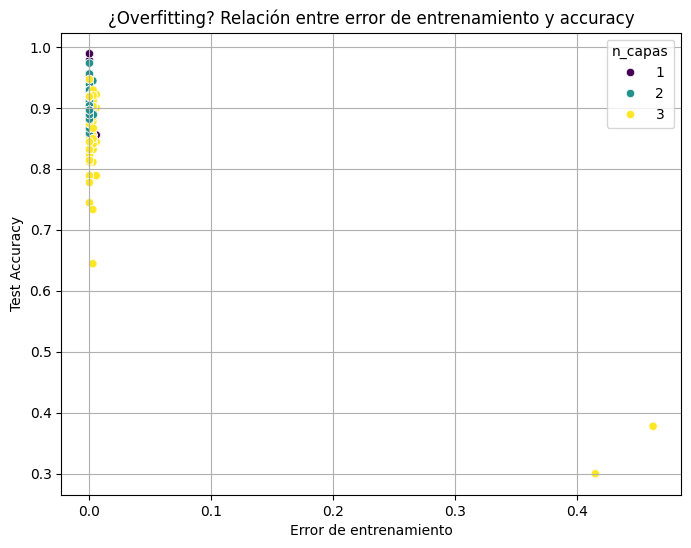

In [16]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_resultados, x='train_error_rate', y='test_accuracy', hue='n_capas', palette='viridis')
plt.title("¿Overfitting? Relación entre error de entrenamiento y accuracy")
plt.xlabel("Error de entrenamiento")
plt.ylabel("Test Accuracy")
plt.grid(True)
plt.show()

**Efecto número de capas**
Las redes con una única capa parecen más estables en varianza y más concentradas en valores altos de accuracy del test.

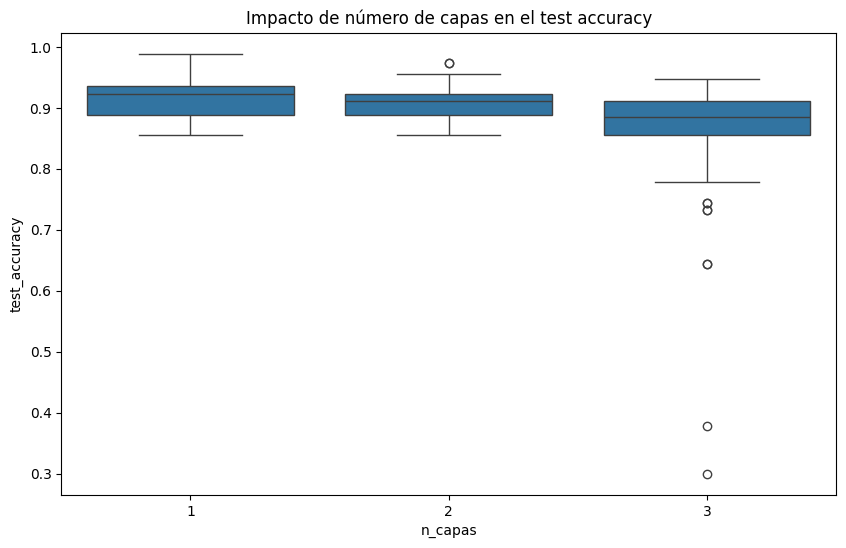

In [182]:
# Comparar complejidad (capas y neuronas) vs accuracy
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_resultados, x='n_capas', y='test_accuracy')
plt.title("Impacto de número de capas en el test accuracy")
plt.show()




**Efecto del número de neuronas** El rendimiento mejora hasta las 10 neuronas, después con 15 parecería menor. Pensamos que el óptimo parece estar entre 8 y 10 neuronas.

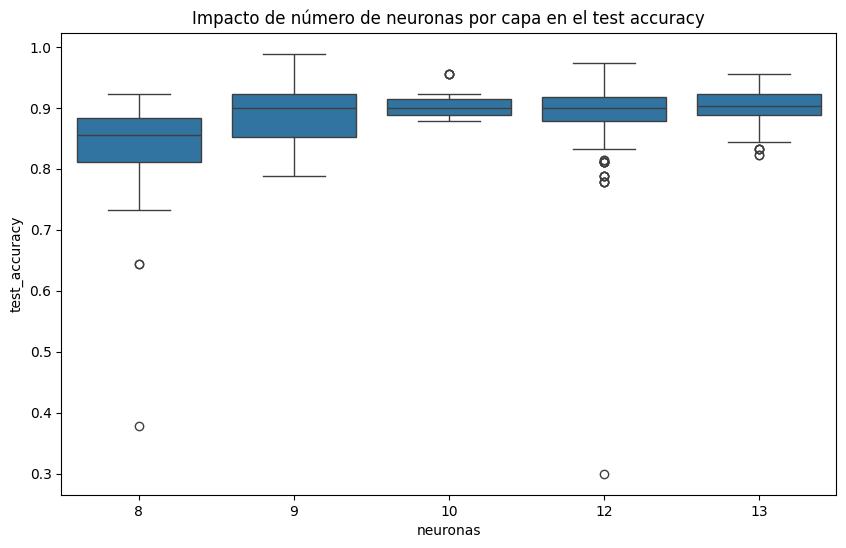

In [183]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_resultados, x='neuronas', y='test_accuracy')
plt.title("Impacto de número de neuronas por capa en el test accuracy")
plt.show()


**Mapa de calor de confusión** construímos una matriz para entender los patrones de error del modelo.

In [17]:
carpeta_modelos = '/content/drive/MyDrive/final_resultados'
archivos_pred = glob(os.path.join(carpeta_modelos, '*_predicciones.csv'))

dfs = []
for archivo in archivos_pred:
    df = pd.read_csv(archivo)
    df['modelo'] = os.path.basename(archivo)
    dfs.append(df)

df_todo = pd.concat(dfs, ignore_index=True)


In [18]:
confusion = df_todo.groupby(['Etiqueta real', 'Etiqueta predicha']).size().unstack(fill_value=0)


Vemos que hay varios pares de clases que presentan confusión sistemática: Federico con Mauricio, Gustavo con Muaricio, Jorgelina con Guadalupe, Daniel con José.

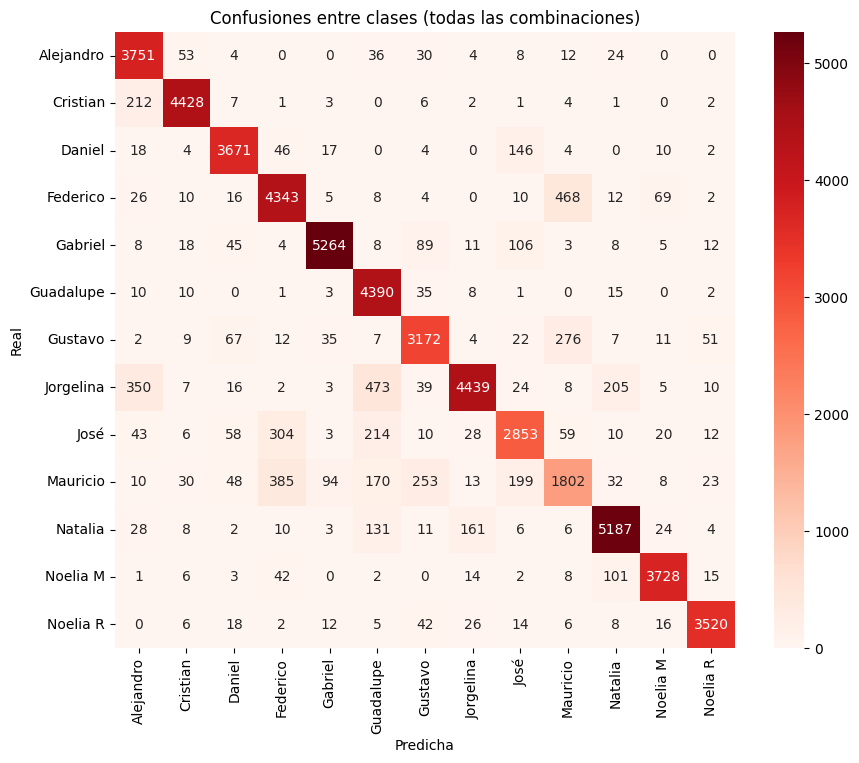

In [19]:
plt.figure(figsize=(10, 8))
sns.heatmap(confusion, annot=True, fmt='d', cmap='Reds')
plt.title('Confusiones entre clases (todas las combinaciones)')
plt.xlabel('Predicha')
plt.ylabel('Real')
plt.show()


Usamos la función *mostrar_confusiones* para ver cuáles son las fotos que confunde.

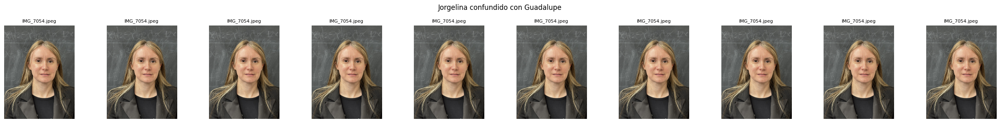

In [20]:
mostrar_confusiones(df_todo, real='Jorgelina', predicha='Guadalupe')


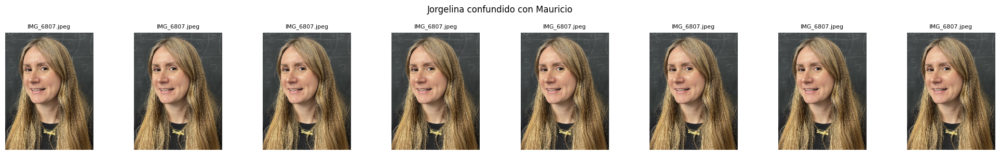

In [21]:
mostrar_confusiones(df_todo, real='Jorgelina', predicha='Mauricio')

### Elección de la combinación de hiperparámetros para el modelo final

In [85]:
# Cargar resultados parciales
ruta_resultados = '/content/drive/MyDrive/parciales_resultados/resultados_parciales.csv'
df_resultados = pd.read_csv(ruta_resultados)

mejor_fila = df_filtrado.iloc[0]  # o podés inspeccionar con .iloc[3], etc.

# Extraer hiperparámetros
params = {
    'semilla_split': int(mejor_fila['semilla_split']),
    'semilla_red': int(mejor_fila['semilla_red']),
    'test_size': float(mejor_fila['test_size']),
    'n_vecinos': int(mejor_fila['n_vecinos_isomap']),
    'n_comp': int(mejor_fila['n_componentes']),
    'n_capas': int(mejor_fila['n_capas']),
    'neuronas': int(mejor_fila['neuronas']),
    'funcion': mejor_fila['funcion_activacion'],
    'lr': float(mejor_fila['learning_rate']),
    'epoch_limit': int(mejor_fila['epoch_limit']),
}

# Nombre del modelo guardado según la combinación
nombre_modelo = (
    f"s{params['semilla_split']}_r{params['semilla_red']}_ts{params['test_size']}_"
    f"v{params['n_vecinos']}_c{params['n_comp']}_cap{params['n_capas']}_"
    f"neu{params['neuronas']}_f{params['funcion']}_lr{params['lr']}_ep{params['epoch_limit']}"
)

nombre_modelo, params

('s42_r1_ts0.2_v15_c30_cap2_neu12_ftansig_lr0.05_ep5000',
 {'semilla_split': 42,
  'semilla_red': 1,
  'test_size': 0.2,
  'n_vecinos': 15,
  'n_comp': 30,
  'n_capas': 2,
  'neuronas': 12,
  'funcion': 'tansig',
  'lr': 0.05,
  'epoch_limit': 5000})

In [86]:
carpeta_modelo = "/content/drive/MyDrive/final_resultados"

# Rutas de los archivos
ruta_red = os.path.join(carpeta_modelo, f"{nombre_modelo}_red.pkl")
ruta_data = os.path.join(carpeta_modelo, f"{nombre_modelo}_data.pkl")

# Cargar red y data
with open(ruta_red, 'rb') as f:
    red = pickle.load(f)

with open(ruta_data, 'rb') as f:
    data = pickle.load(f)

# Crear objeto multiperceptron con red y data cargados
mp = multiperceptron()
mp.red = red
mp.data = data

print("✅ Red y datos cargados correctamente.")


✅ Red y datos cargados correctamente.


In [87]:
carpeta_modelo = '/content/drive/MyDrive/final_resultados'
ruta_red = os.path.join(carpeta_modelo, f"{nombre_modelo}_red.pkl")
ruta_data = os.path.join(carpeta_modelo, f"{nombre_modelo}_data.pkl")

with open(ruta_red, 'rb') as f:
    red = pickle.load(f)
with open(ruta_data, 'rb') as f:
    data = pickle.load(f)

# Crear objeto y cargar pesos
mp = multiperceptron()
mp.red = red
mp.data = data


In [88]:
# Cargar rostros procesados
with open('/content/drive/MyDrive/rostros_dataset.pkl', 'rb') as f:
    X, y, paths = pickle.load(f)

# Aplanar imágenes
X_flat = X.reshape((X.shape[0], -1))

# Split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test, paths_train, paths_test = train_test_split(
    X_flat, y, paths, test_size=params['test_size'], random_state=params['semilla_split'], stratify=y
)

# Isomap
from sklearn.manifold import Isomap
iso = Isomap(n_neighbors=params['n_vecinos'], n_components=params['n_comp'])
X_train_reducido = iso.fit_transform(X_train)
X_test_reducido = iso.transform(X_test)


In [89]:
columnas = [f"x{i+1}" for i in range(X_train_reducido.shape[1])]

df_train = pl.DataFrame(X_train_reducido, schema=columnas).with_columns(pl.Series("y", y_train))
df_test = pl.DataFrame(X_test_reducido, schema=columnas).with_columns(pl.Series("y", y_test))

In [90]:
# Predecir sobre train
y_pred_train, y_proba_train, _ = mp.predecir(df_train, campos=columnas, clase="y")

# Predecir sobre test
y_pred_test, y_proba_test, _ = mp.predecir(df_test, campos=columnas, clase="y")


In [91]:
df_eval_test = pd.DataFrame({
    'Etiqueta real': y_test,
    'Etiqueta predicha': y_pred_test,
    'Probabilidad predicha': [max(p) if len(p.shape) > 0 else p for p in y_proba_test],
    'Path imagen': paths_test
})

df_confundidas = df_eval_test[df_eval_test['Etiqueta real'] != df_eval_test['Etiqueta predicha']]
df_confundidas

,Etiqueta real,Etiqueta predicha,Probabilidad predicha,Path imagen
4,Jorgelina,Mauricio,0.849314,/content/drive/MyDrive/Caras/Jorgelina/IMG_680...
5,Gustavo,Mauricio,0.386644,/content/drive/MyDrive/Caras/Gustavo/20250404_...
47,Mauricio,Gustavo,0.576763,/content/drive/MyDrive/Caras/Mauricio/20250321...
49,Jorgelina,Guadalupe,0.967300,/content/drive/MyDrive/Caras/Jorgelina/IMG_705...
64,Natalia,Guadalupe,0.538407,/content/drive/MyDrive/Caras/Natalia/IMG_1070.JPG


In [92]:
df_eval_train= pd.DataFrame({
    'Etiqueta real': y_train,
    'Etiqueta predicha': y_pred_train,
    'Probabilidad predicha': [max(p) if len(p.shape) > 0 else p for p in y_proba_train],
    'Path imagen': paths_train
})

df_confundidas = df_eval_train[df_eval_train['Etiqueta real'] != df_eval_train['Etiqueta predicha']]
df_confundidas

,Etiqueta real,Etiqueta predicha,Probabilidad predicha,Path imagen
248,Mauricio,Gustavo,0.444698,/content/drive/MyDrive/Caras/Mauricio/20250321...


## Final training

In [93]:
X_entero, _, y_entero, _, paths_entero, _ = train_test_split(
    X_flat, y, paths, test_size=params['test_size'], random_state=params['semilla_split'], stratify=y
)

# Isomap
iso_final = Isomap(n_neighbors=params['n_vecinos'], n_components=params['n_comp'])
X_entero_reducido = iso_final.fit_transform(X_entero)

# Preparar DataFrame para entrenamiento
columnas = [f"x{i+1}" for i in range(params['n_comp'])]
df_entero = pl.DataFrame(X_entero_reducido, schema=columnas).with_columns(pl.Series("y", y_entero))

#Inicializar y entrenar la red
mp = multiperceptron()
mp.inicializar(
    df=df_entero,
    campos=columnas,
    clase="y",
    hidden_layers_sizes=[params['neuronas']] * params['n_capas'],
    layers_func=[params['funcion']] * params['n_capas'] + ['softmax'],
    semilla=params['semilla_red'],
    carpeta="/content/drive/MyDrive/final_resultados",
    clases_totales=clases_totales
)


mp.data['columnas'] = columnas


epoch, mse, train_error = mp.entrenar(
    epoch_limit=params['epoch_limit'],
    MSE_umbral=0.0005,
    learning_rate=params['lr'],
    lr_momento=0.1,
    retomar=False,
    save_frequency=500
)

nombre_final = "modelo_grupo4"
carpeta_modelo = "/content/drive/MyDrive/final_resultados"
ruta_red = os.path.join(carpeta_modelo, f"{nombre_final}_red.pkl")
ruta_data = os.path.join(carpeta_modelo, f"{nombre_final}_data.pkl")
ruta_iso = os.path.join(carpeta_modelo, f"{nombre_final}_isomap.pkl")

with open(ruta_red, 'wb') as f:
    pickle.dump(mp.red, f)

with open(ruta_data, 'wb') as f:
    pickle.dump(mp.data, f)

with open(ruta_iso, 'wb') as f:
    pickle.dump(iso_final, f)

print("✅ Modelo entrenado y guardado correctamente.")
nombre_final, epoch, mse, train_error


✅ Modelo entrenado y guardado correctamente.


('modelo_grupo4',
 7,
 np.float64(0.0004884134422696462),
 np.float64(0.002785515320334262))

In [94]:
print(f"X_flat shape: {X_flat.shape}")
print(f"y shape: {y.shape}")


X_flat shape: (449, 6400)
y shape: (449,)


### Un tuneo más

In [122]:
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


In [123]:
nombre_final = "modelo_grupo4"
carpeta_modelo = "/content/drive/MyDrive/final_resultados"
ruta_red = os.path.join(carpeta_modelo, f"{nombre_final}_red.pkl")
ruta_data = os.path.join(carpeta_modelo, f"{nombre_final}_data.pkl")
ruta_iso = os.path.join(carpeta_modelo, f"{nombre_final}_isomap.pkl")


In [124]:
with open(ruta_red, 'rb') as f:
    red = pickle.load(f)
with open(ruta_data, 'rb') as f:
    data = pickle.load(f)
with open(ruta_iso, 'rb') as f:
    iso = pickle.load(f)

mp = multiperceptron()
mp.red = red
mp.data = data

In [125]:
df_intrusos = leer_imagenes("/content/drive/MyDrive/Intrusos", usar_subcarpetas=False)


In [126]:
X_intrusos, _, paths_intrusos = procesar_rostros(
    df_intrusos, face_net, output_size=(80, 80), margen=0.02
)


Rostros no detectados:
Total fallidos: 0 / 41 imágenes (0.0%)


In [127]:
X_intrusos_flat = X_intrusos.reshape((X_intrusos.shape[0], -1))
X_intrusos_reducido = iso.transform(X_intrusos_flat)
# Escalado a [0,1] si las imágenes están en uint8
#if X_intrusos_flat.max() > 1:
 #   X_intrusos_flat = X_intrusos_flat / 255.0


In [128]:
columnas = [f"x{i+1}" for i in range(X_intrusos_reducido.shape[1])]
df_intrusos_prod = pl.DataFrame(X_intrusos_reducido, schema=columnas)

In [129]:
y_pred, y_proba, _ = mp.predecir(df_intrusos_prod, campos=columnas, clase=None)

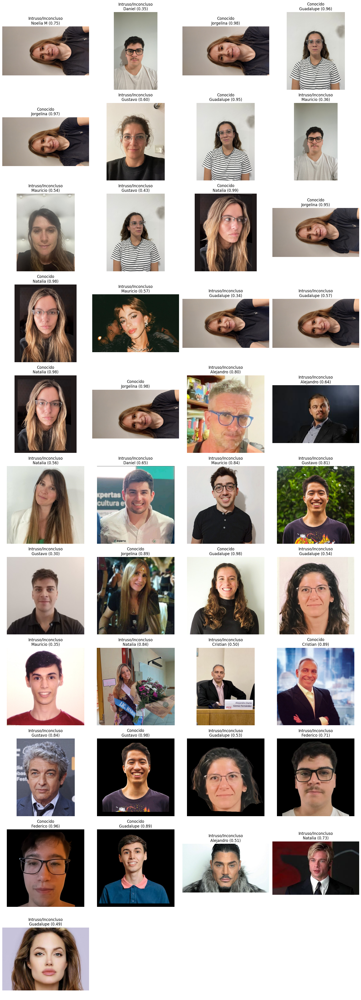

In [130]:
umbral_intruso = 0.85
n_cols = 4
n_imgs = len(paths_intrusos)
n_rows = math.ceil(n_imgs / n_cols)


fig, axs = plt.subplots(n_rows, n_cols, figsize=(n_cols * 4, n_rows * 4))

for i, path in enumerate(paths_intrusos):
    # Imagen original en color
    img = mpimg.imread(path)

    # Pedicción
    clase_predicha = y_pred[i]
    confianza = np.max(y_proba[i])
    es_intruso = confianza < umbral_intruso

    # Etiqueta
    titulo = (
        f"{'Intruso/Inconcluso' if es_intruso else 'Conocido'}\n"
        f"{clase_predicha} ({confianza:.2f})"
    )

    row = i // n_cols
    col = i % n_cols

    axs[row, col].imshow(img)
    axs[row, col].set_title(titulo)
    axs[row, col].axis("off")


for j in range(n_imgs, n_rows * n_cols):
    row = j // n_cols
    col = j % n_cols
    axs[row, col].axis("off")

plt.tight_layout()
plt.show()


*Crónicas de una muerte anunciada:* tenemos la sospecha que puede haber algo de overfitting en la forma en la que realizamos el experimento. Todas las fotos comparten misma luz, día, horario, entonces creemos que es muy similar el training del testing y por eso obtuvimos accuracy de testing muy alto, ya que probablemente la imagen del training sea muy similar a la del testing.
Al alejarnos mucho de las condiciones del entrenamiento, diferente luz, ángulos,ya vemos que nuestro modelo "hace agua".

## Producción

Para ejecutar la siguiente línea es necesario que se importen las bibliotecas y las herramientas definidas al inicio (clases, funciones, el modelo de detección de rostros)

In [131]:
base_url = "https://raw.githubusercontent.com/nataliamarinn/Nuestras_caras_grupo4/main"


In [132]:
archivos = {
    "modelo_grupo4_red.pkl": f"{base_url}/modelo_grupo4_red.pkl",
    "modelo_grupo4_data.pkl": f"{base_url}/modelo_grupo4_data.pkl",
    "modelo_grupo4_isomap.pkl": f"{base_url}/modelo_grupo4_isomap.pkl",
}

# Descargar y guardar en carpeta temporal
for nombre, url in archivos.items():
    !wget -O {nombre} {url}

--2025-05-05 01:38:21--  https://raw.githubusercontent.com/nataliamarinn/Nuestras_caras_grupo4/main/modelo_grupo4_red.pkl
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.111.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 12722 (12K) [application/octet-stream]
Saving to: ‘modelo_grupo4_red.pkl’

modelo_grupo4_red.p 100%[===================>]  12.42K  --.-KB/s    in 0.001s  

2025-05-05 01:38:22 (17.3 MB/s) - ‘modelo_grupo4_red.pkl’ saved [12722/12722]

--2025-05-05 01:38:22--  https://raw.githubusercontent.com/nataliamarinn/Nuestras_caras_grupo4/main/modelo_grupo4_data.pkl
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request se

In [133]:
clasificar_widget_usuario(
    modelo_red_path="modelo_grupo4_red.pkl",
    modelo_data_path="modelo_grupo4_data.pkl",
    modelo_iso_path="modelo_grupo4_isomap.pkl",
    face_net=face_net,
    umbral=0.70
)

HTML(value='<h3>Subí tus imágenes o un ZIP con fotos</h3>')

FileUpload(value={}, accept='.jpg,.jpeg,.png,.jfif,.zip', description='Upload', multiple=True)

Button(description='Clasificar imágenes', style=ButtonStyle())

Output()